# Import necessary libraries

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import qnorm
import numpy as np
from scipy.stats import variation
from scipy.stats import zscore

# Open the data

In [2]:
file_path = '/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/log2expressiondata.csv'
df = pd.read_csv(file_path, index_col = 0)
df.head(5)

,77322072-2a7f-49e6-a9d1-c521c25acd70.rna_seq.augmented_star_gene_counts.tsv,6f6bf240-1ca4-47d0-9a77-17b0ce9b8ae7.rna_seq.augmented_star_gene_counts.tsv,59e8b7b7-5183-4655-aa5e-e4b5ba73eded.rna_seq.augmented_star_gene_counts.tsv,5418228b-cfd0-4580-87c6-3ebf6282ad73.rna_seq.augmented_star_gene_counts.tsv,c7fd0bf8-753e-45d6-b987-51ec7559f728.rna_seq.augmented_star_gene_counts.tsv,50c308c9-922a-4083-ae09-e5e4d8c437af.rna_seq.augmented_star_gene_counts.tsv,55071ef3-bf09-43a2-a54c-a9ec61a84615.rna_seq.augmented_star_gene_counts.tsv,7d9c7c34-76e0-4622-b5f7-60e12f6d4e07.rna_seq.augmented_star_gene_counts.tsv,32675d71-6f79-4b8f-ab7c-e2350b15875c.rna_seq.augmented_star_gene_counts.tsv,3d11905a-16eb-40b2-a36b-e37dca6359d3.rna_seq.augmented_star_gene_counts.tsv,...,4c87674d-dd05-490d-a584-84490509f4d4.rna_seq.augmented_star_gene_counts.tsv,5cfb768f-7b49-4a72-92c9-d7502f5ba5b8.rna_seq.augmented_star_gene_counts.tsv,03ef99c7-55b7-4770-9eac-2ee007aa78ca.rna_seq.augmented_star_gene_counts.tsv,3ab1dfbc-ab83-446e-b680-cd6aec12b177.rna_seq.augmented_star_gene_counts.tsv,029a2c3e-0fd1-4cb4-9021-3947d28ca28d.rna_seq.augmented_star_gene_counts.tsv,ed41fe8b-fe2e-4bf3-91e3-2cf50ddcbc78.rna_seq.augmented_star_gene_counts.tsv,b9a5766c-e155-423e-a075-10fb14fe87df.rna_seq.augmented_star_gene_counts.tsv,a462c0f9-23d3-428b-9b61-e42cb6a68af1.rna_seq.augmented_star_gene_counts.tsv,0d3cfbc0-4420-48ed-a459-2e18d2ece5b6.rna_seq.augmented_star_gene_counts.tsv,d43517e2-e447-42cc-93e1-cbc9669ef4f1.rna_seq.augmented_star_gene_counts.tsv
gene_name,,,,,,,,,,,,,,,,,,,,,
TSPAN6,5.853883,6.242844,5.877366,5.554976,3.746270,5.778416,6.605066,6.116313,5.103242,5.100397,...,5.004560,5.073456,5.734804,5.092191,5.545338,5.857862,5.716747,5.352275,5.517622,3.911040
TNMD,0.000000,0.222557,0.000000,0.000000,0.107688,0.088956,0.000000,0.000000,0.000000,1.341758,...,0.000000,0.000000,0.035061,0.055335,0.065021,0.000000,0.000000,0.000000,0.000000,0.000000
DPM1,6.474339,6.794343,7.083010,7.648951,5.943865,5.608244,6.771603,6.813068,5.584301,6.713725,...,6.198396,6.507392,6.843400,6.794808,6.137436,6.854949,6.647530,6.690696,7.539495,6.633021
SCYL3,3.294180,3.387142,3.666132,4.221467,2.147893,2.470016,4.229765,3.583724,2.693632,4.618344,...,2.987357,2.368098,3.344133,3.016461,2.465060,3.315856,2.725916,2.816661,2.570171,2.630732
C1orf112,2.783813,2.667915,2.528596,2.275037,1.197425,1.931305,4.033529,3.424828,1.687509,4.613820,...,3.734807,2.546240,3.385155,2.828977,1.683876,3.925373,2.505129,2.827535,3.220438,2.804818


# Quantile normalization

To normalize the data we will use quantile normalization technique. Thus makes two distributions identical in statistical properties. 

In [3]:
qnorm_df = qnorm.quantile_normalize(df, axis=1)

# Graphic representations before and after normalization

## Boxplots

To visualize the distribution of our data, and see how it changes before and after the quantile normalization, we will plot 3 sets of 20 random samples arond the data in boxplots and in density plots. 

In the plots, it is appreciable that the data has been normalized, having an homogeneous distribution of expression values around all the plotted samples.

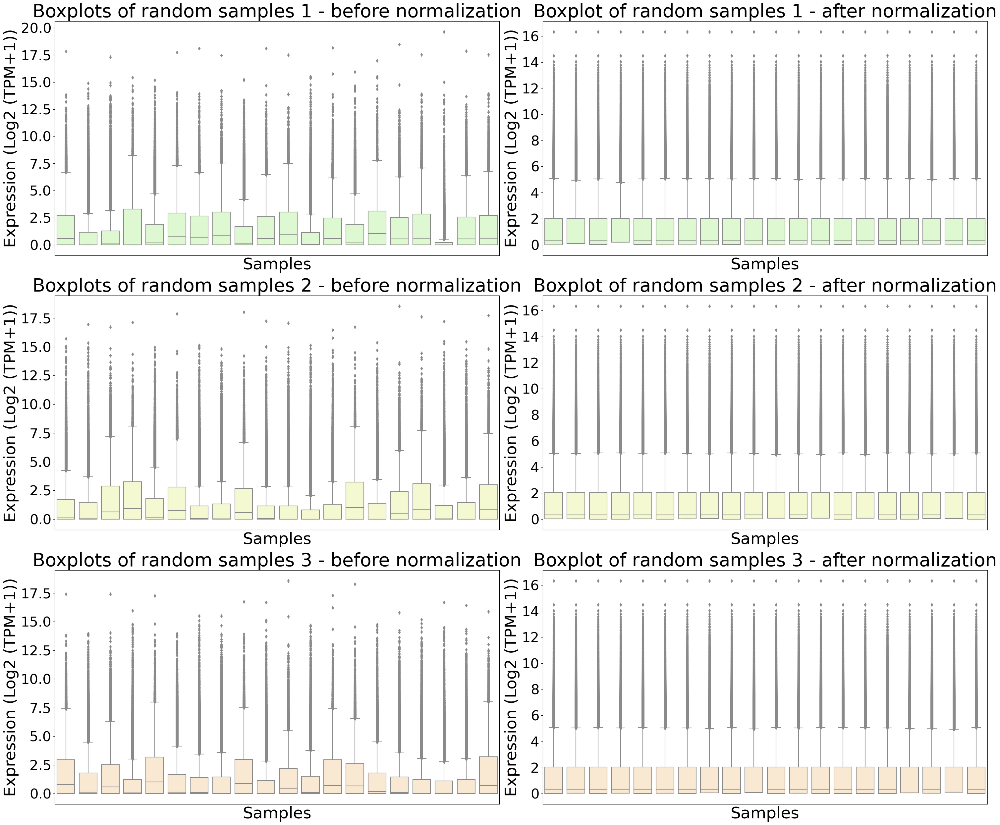

In [4]:
plt.figure(figsize = (30, 25))
random_columns_sets = [np.random.choice(qnorm_df.columns, 20, replace = False) for _ in range(3)]
colors = ['#DCFFCC', '#FAFFCC', '#FFE9CC']

for i, selected_columns in enumerate(random_columns_sets):
    col = colors[i]
    plt.subplot(3, 2, 2 * i + 1)  
    random_df = df[selected_columns]
    sns.boxplot(random_df, color = col)
    plt.title(f'Boxplots of random samples {i + 1} - before normalization', fontsize = 40)
    plt.ylabel('Expression (Log2 (TPM+1))', fontsize = 35)
    plt.xlabel('Samples', fontsize = 35)
    plt.yticks(fontsize = 30) 
    plt.xticks([]) 
    
    plt.subplot(3, 2, 2 * i + 2)  
    random_norm_df = qnorm_df[selected_columns]
    sns.boxplot(random_norm_df, color = col)
    plt.title(f'Boxplot of random samples {i + 1} - after normalization', fontsize = 40)
    plt.ylabel('Expression (Log2 (TPM+1))', fontsize = 35)
    plt.xlabel('Samples', fontsize = 35)
    plt.yticks(fontsize = 30) 
    plt.xticks([]) 
plt.tight_layout()

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/boxplot_ba_norm.png')

## Density plots

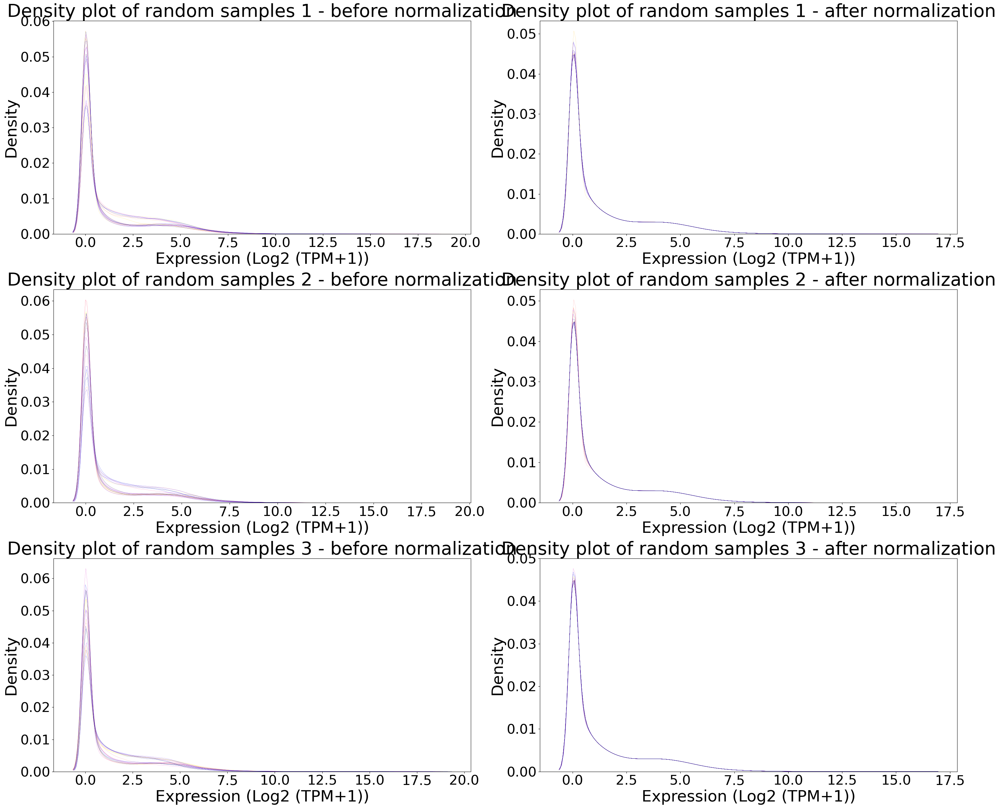

In [5]:
plt.figure(figsize = (30, 25))
random_columns_sets = [np.random.choice(qnorm_df.columns, 20, replace = False) for _ in range(3)]

for i, selected_columns in enumerate(random_columns_sets):
    plt.subplot(3, 2, 2 * i + 1)  
    random_df = df[selected_columns]
    sns.kdeplot(data = random_df, legend = False, palette = 'gnuplot2', linewidth = .2)
    plt.title(f'Density plot of random samples {i + 1} - before normalization', fontsize = 40)
    plt.ylabel('Density', fontsize = 35)
    plt.xlabel('Expression (Log2 (TPM+1))', fontsize = 35)
    plt.yticks(fontsize = 30) 
    plt.xticks(fontsize = 30) 

    plt.subplot(3, 2, 2 * i + 2)  
    random_norm_df = qnorm_df[selected_columns]
    sns.kdeplot(data = random_norm_df, legend = False, palette = 'gnuplot2', linewidth = .2)
    plt.title(f'Density plot of random samples {i + 1} - after normalization', fontsize = 40)
    plt.ylabel('Density', fontsize = 35)
    plt.xlabel('Expression (Log2 (TPM+1))', fontsize = 35)
    plt.yticks(fontsize = 30) 
    plt.xticks(fontsize = 30) 
plt.tight_layout()

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/histogram_ba_norm.png')

# Variable selection

To select the data (genes) we will first look for each gene maximum value of expression (Log2(TPM+1)) to filter-out genes that don't have expression greater than 3.45 (that equals 10 TPMs) around samples.

In [6]:
max_gene_exp = qnorm_df.max(axis=1)
max_gene_exp.head(5)

gene_name
TSPAN6      8.548176
TNMD        8.925307
DPM1        8.672244
SCYL3       5.929595
C1orf112    6.273691
dtype: float64

In [8]:
np.log2(10+1)

3.4594316186372973

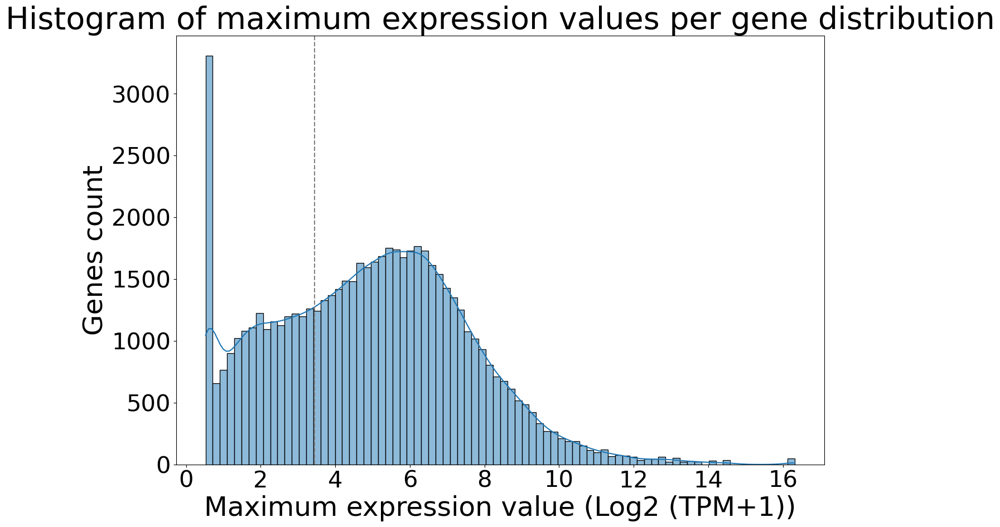

In [7]:
plt.figure(figsize = (15, 10))
sns.histplot(data = max_gene_exp, kde = True)
plt.axvline(x = 3.45, color = 'red', linestyle = '--')

plt.title('Histogram of maximum expression values per gene distribution', fontsize = 40)
plt.ylabel('Genes count', fontsize = 35)
plt.xlabel('Maximum expression value (Log2 (TPM+1))', fontsize = 35)
plt.yticks(fontsize = 30) 
plt.xticks(fontsize = 30) 

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/histogram_max_gene.png')

In [9]:
max_sel = max_gene_exp >= 3.45 
print(pd.Series(max_sel).value_counts())
max_subset = qnorm_df[max_sel]

True     42117
False    18543
Name: count, dtype: int64


Next, we will pick genes that we are going to use for the rest of our project by their CV and average of expression above samples, using hard thresholds. And we will store the filtered data frame of normalized data and its z-scores in two files.

In [10]:
average_expression = max_subset.sum(axis=1) / max_subset.shape[1]
cv_by_rows = max_subset.apply(lambda row: variation(row), axis=1)*100
gene_exp = pd.DataFrame({
    'Average': average_expression,
    'CV': cv_by_rows
})

value = (gene_exp['Average'] >= 2) & (gene_exp['CV'] >= 35) 
gene_exp['Threshold']= np.where( value == True , 'Higher', 'Lower')
print(pd.Series(gene_exp['Threshold']).value_counts())
gene_exp.head(5)

Threshold
Lower     38551
Higher     3566
Name: count, dtype: int64


,Average,CV,Threshold
gene_name,,,
TSPAN6,4.914053,19.470622,Lower
TNMD,0.354498,175.902717,Lower
DPM1,6.390922,9.355358,Lower
SCYL3,3.334486,13.979415,Lower
C1orf112,2.641021,30.416770,Lower


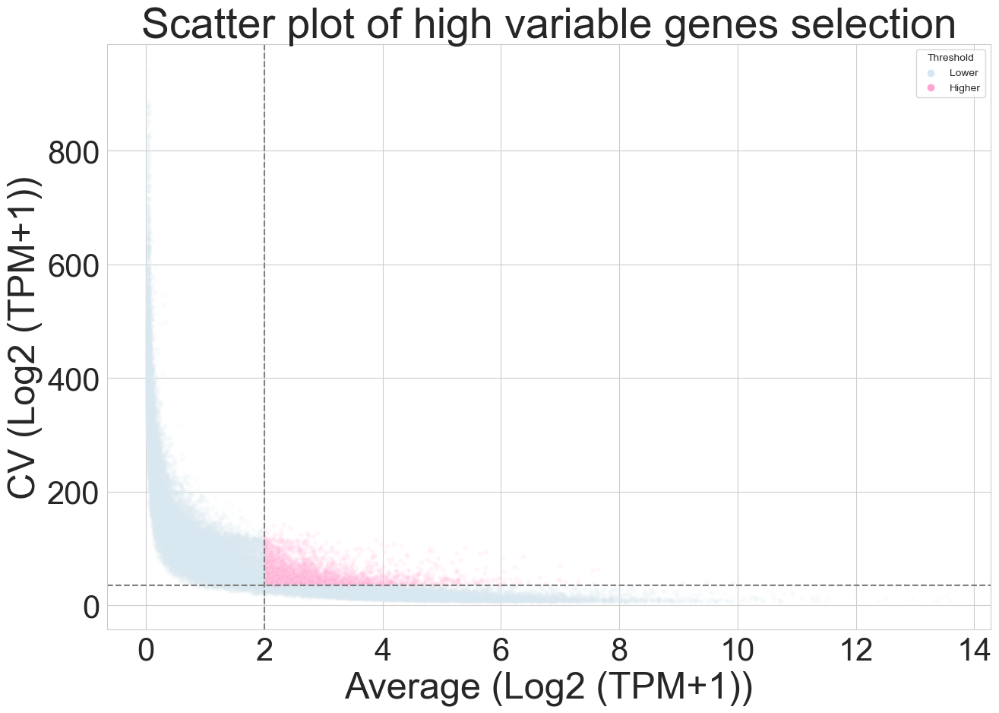

In [11]:
plt.figure(figsize = (15, 10))
sns.set_style('whitegrid')

sns.scatterplot(x = gene_exp['Average'], y = gene_exp['CV'], hue = gene_exp['Threshold'], palette={'#D4E7F0', '#FFA5D5'}, s=20, linewidth=0.5, alpha=.1)
plt.axvline(x = 2, color = 'grey', linestyle = '--')
plt.axhline(y = 35, color = 'grey', linestyle = '--')

plt.xlabel('Average (Log2 (TPM+1))', fontsize = 35) 
plt.ylabel('CV (Log2 (TPM+1))', fontsize = 35)
plt.title('Scatter plot of high variable genes selection', fontsize = 40)
plt.yticks(fontsize = 30) 
plt.xticks(fontsize = 30) 

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/scatterplot_selgenes.png')

In [12]:
subset = max_subset[gene_exp['Threshold'] == 'Higher']
subset.to_csv('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/filtered_data.csv')
subset

,77322072-2a7f-49e6-a9d1-c521c25acd70.rna_seq.augmented_star_gene_counts.tsv,6f6bf240-1ca4-47d0-9a77-17b0ce9b8ae7.rna_seq.augmented_star_gene_counts.tsv,59e8b7b7-5183-4655-aa5e-e4b5ba73eded.rna_seq.augmented_star_gene_counts.tsv,5418228b-cfd0-4580-87c6-3ebf6282ad73.rna_seq.augmented_star_gene_counts.tsv,c7fd0bf8-753e-45d6-b987-51ec7559f728.rna_seq.augmented_star_gene_counts.tsv,50c308c9-922a-4083-ae09-e5e4d8c437af.rna_seq.augmented_star_gene_counts.tsv,55071ef3-bf09-43a2-a54c-a9ec61a84615.rna_seq.augmented_star_gene_counts.tsv,7d9c7c34-76e0-4622-b5f7-60e12f6d4e07.rna_seq.augmented_star_gene_counts.tsv,32675d71-6f79-4b8f-ab7c-e2350b15875c.rna_seq.augmented_star_gene_counts.tsv,3d11905a-16eb-40b2-a36b-e37dca6359d3.rna_seq.augmented_star_gene_counts.tsv,...,4c87674d-dd05-490d-a584-84490509f4d4.rna_seq.augmented_star_gene_counts.tsv,5cfb768f-7b49-4a72-92c9-d7502f5ba5b8.rna_seq.augmented_star_gene_counts.tsv,03ef99c7-55b7-4770-9eac-2ee007aa78ca.rna_seq.augmented_star_gene_counts.tsv,3ab1dfbc-ab83-446e-b680-cd6aec12b177.rna_seq.augmented_star_gene_counts.tsv,029a2c3e-0fd1-4cb4-9021-3947d28ca28d.rna_seq.augmented_star_gene_counts.tsv,ed41fe8b-fe2e-4bf3-91e3-2cf50ddcbc78.rna_seq.augmented_star_gene_counts.tsv,b9a5766c-e155-423e-a075-10fb14fe87df.rna_seq.augmented_star_gene_counts.tsv,a462c0f9-23d3-428b-9b61-e42cb6a68af1.rna_seq.augmented_star_gene_counts.tsv,0d3cfbc0-4420-48ed-a459-2e18d2ece5b6.rna_seq.augmented_star_gene_counts.tsv,d43517e2-e447-42cc-93e1-cbc9669ef4f1.rna_seq.augmented_star_gene_counts.tsv
gene_name,,,,,,,,,,,,,,,,,,,,,
GCLC,4.659531,4.550313,5.212196,4.376680,3.434741,7.450629,3.019311,3.739791,5.583473,5.338847,...,6.692745,7.084762,5.284149,6.355102,4.227969,7.750056,4.101505,7.766053,5.315648,4.351920
STPG1,2.807555,2.575508,2.931504,3.528094,2.886748,2.677024,3.042325,2.163490,2.930125,0.464341,...,3.772342,3.740875,2.835235,3.831566,2.879161,3.376644,3.832112,3.453709,2.631248,3.539640
CFTR,1.304549,3.261332,3.722217,2.346879,4.177960,0.959881,3.200447,0.486827,1.704877,4.124809,...,1.534269,0.231615,0.813929,1.584977,3.721113,0.699277,3.488332,3.131197,2.857047,0.752304
HS3ST1,3.619455,3.627142,4.217653,2.136918,2.232058,3.251150,3.301567,4.491512,4.344818,3.319418,...,3.583543,1.737135,1.555058,2.960988,3.033466,3.351035,4.721262,4.242741,2.991749,2.591893
AOC1,6.065440,6.483734,1.117744,4.260121,2.761293,1.582193,1.809953,6.482846,5.514515,0.084273,...,1.193965,0.847151,1.257461,0.683391,2.679690,1.346708,1.720165,0.578644,4.215406,1.339194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AL031602.2,1.259244,1.301887,1.911189,1.350708,2.159679,1.607161,2.411271,1.924241,1.905396,1.300858,...,1.162030,1.687821,1.106713,1.586875,1.155961,1.155593,1.370398,2.372539,0.851671,2.396989
AC127526.5,3.546550,4.348213,4.823958,6.508715,4.351644,4.641910,3.069930,4.575394,3.413488,0.451978,...,3.784909,2.136918,1.516726,2.133445,3.177958,2.283315,3.899049,2.278673,2.866333,2.289599
AC007881.4,1.564718,2.317361,3.781643,2.071394,1.575711,2.123559,2.042885,2.514577,2.440676,5.090893,...,1.549843,2.221857,2.237369,1.590107,1.761645,0.917679,0.676066,3.423569,0.854539,2.404061


In [13]:
z_scores = zscore(subset, axis=1, ddof=1)
z_scores.to_csv('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/filtered_zdata.csv')
z_scores

,77322072-2a7f-49e6-a9d1-c521c25acd70.rna_seq.augmented_star_gene_counts.tsv,6f6bf240-1ca4-47d0-9a77-17b0ce9b8ae7.rna_seq.augmented_star_gene_counts.tsv,59e8b7b7-5183-4655-aa5e-e4b5ba73eded.rna_seq.augmented_star_gene_counts.tsv,5418228b-cfd0-4580-87c6-3ebf6282ad73.rna_seq.augmented_star_gene_counts.tsv,c7fd0bf8-753e-45d6-b987-51ec7559f728.rna_seq.augmented_star_gene_counts.tsv,50c308c9-922a-4083-ae09-e5e4d8c437af.rna_seq.augmented_star_gene_counts.tsv,55071ef3-bf09-43a2-a54c-a9ec61a84615.rna_seq.augmented_star_gene_counts.tsv,7d9c7c34-76e0-4622-b5f7-60e12f6d4e07.rna_seq.augmented_star_gene_counts.tsv,32675d71-6f79-4b8f-ab7c-e2350b15875c.rna_seq.augmented_star_gene_counts.tsv,3d11905a-16eb-40b2-a36b-e37dca6359d3.rna_seq.augmented_star_gene_counts.tsv,...,4c87674d-dd05-490d-a584-84490509f4d4.rna_seq.augmented_star_gene_counts.tsv,5cfb768f-7b49-4a72-92c9-d7502f5ba5b8.rna_seq.augmented_star_gene_counts.tsv,03ef99c7-55b7-4770-9eac-2ee007aa78ca.rna_seq.augmented_star_gene_counts.tsv,3ab1dfbc-ab83-446e-b680-cd6aec12b177.rna_seq.augmented_star_gene_counts.tsv,029a2c3e-0fd1-4cb4-9021-3947d28ca28d.rna_seq.augmented_star_gene_counts.tsv,ed41fe8b-fe2e-4bf3-91e3-2cf50ddcbc78.rna_seq.augmented_star_gene_counts.tsv,b9a5766c-e155-423e-a075-10fb14fe87df.rna_seq.augmented_star_gene_counts.tsv,a462c0f9-23d3-428b-9b61-e42cb6a68af1.rna_seq.augmented_star_gene_counts.tsv,0d3cfbc0-4420-48ed-a459-2e18d2ece5b6.rna_seq.augmented_star_gene_counts.tsv,d43517e2-e447-42cc-93e1-cbc9669ef4f1.rna_seq.augmented_star_gene_counts.tsv
gene_name,,,,,,,,,,,,,,,,,,,,,
GCLC,0.092111,0.024984,0.431789,-0.081735,-0.660668,1.807572,-0.915999,-0.473179,0.659983,0.509631,...,1.341763,1.582704,0.476013,1.134241,-0.173135,1.991605,-0.250862,2.001437,0.495373,-0.096953
STPG1,0.552576,0.284289,0.695884,1.385648,0.644138,0.401659,0.824013,-0.192078,0.694290,-2.156596,...,1.668042,1.631661,0.584580,1.736516,0.635366,1.210544,1.737147,1.299646,0.348735,1.398998
CFTR,-0.846844,0.454121,0.760540,-0.153852,1.063540,-1.075996,0.413641,-1.390506,-0.580686,1.028202,...,-0.694115,-1.560183,-1.173032,-0.660402,0.759806,-1.249258,0.605041,0.367601,0.185332,-1.214004
HS3ST1,0.838805,0.845227,1.338536,-0.399694,-0.320215,0.531127,0.573244,1.567315,1.444768,0.588157,...,0.808805,-0.733669,-0.885775,0.288727,0.349275,0.614570,1.759246,1.359494,0.314425,-0.019611
AOC1,2.069025,2.289553,-0.539441,1.117246,0.327052,-0.294580,-0.174503,2.289085,1.778573,-1.084296,...,-0.499257,-0.682100,-0.465781,-0.768436,0.284029,-0.418729,-0.221840,-0.823659,1.093672,-0.422691
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AL031602.2,-1.242787,-1.188760,-0.416797,-1.126905,-0.101970,-0.801989,0.216787,-0.400261,-0.424137,-1.190063,...,-1.365953,-0.699796,-1.436037,-0.827691,-1.373641,-1.374108,-1.101958,0.167714,-1.759166,0.198692
AC127526.5,0.076076,0.691592,1.056868,2.350422,0.694226,0.917092,-0.289872,0.866021,-0.026088,-2.299931,...,0.259088,-1.006237,-1.482420,-1.008904,-0.206928,-0.893834,0.346724,-0.897398,-0.446193,-0.889009
AC007881.4,-0.621467,0.337988,2.204626,0.024434,-0.607452,0.090933,-0.011909,0.589395,0.495187,3.873630,...,-0.640429,0.216241,0.236015,-0.589102,-0.370427,-1.446299,-1.754303,1.748160,-1.526788,0.448511


# Heatmaps

To visualize all the data manipulation done on this notebook, we will plot heatmaps of: a set of random genes around samples after normalization; all selected genes around samples; all selected genes z-socres around samples and finally a clustermap with these.
Going through the created plots we can se that they go from less informative to more informative and interpretable. In the clustermap, we can appreciate different gene expression patterns around samples. Looking further, we can expect around 3 to 6 clusters of samples when performing the clustering in the next notebooks.

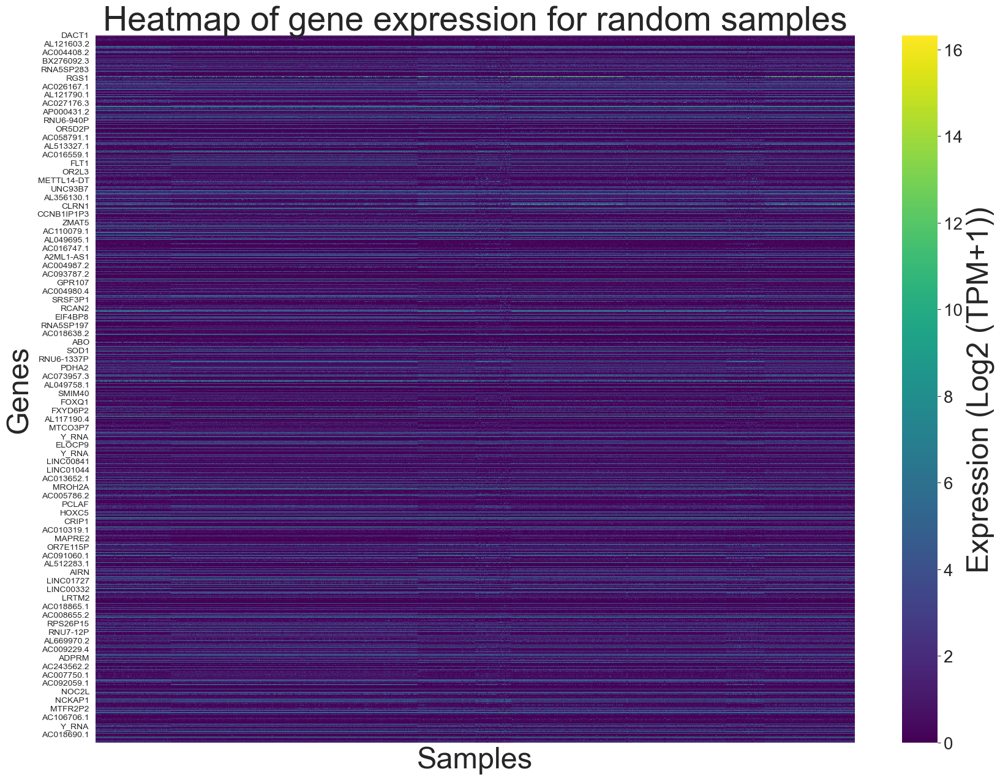

In [14]:
random_qnorm_df = qnorm_df.sample(n=3566)
plt.figure(figsize = (20, 15)) 

heatmap = sns.heatmap(random_qnorm_df, cmap = 'viridis', xticklabels = False)

plt.title('Heatmap of gene expression for random samples', fontsize = 40)
plt.xlabel('Samples', fontsize = 35)
plt.ylabel('Genes', fontsize = 35)

cbar = heatmap.collections[0].colorbar
cbar.ax.set_ylabel('Expression (Log2 (TPM+1))', fontsize = 35)
cbar.ax.tick_params(labelsize = 20)

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/random_heatmap.png')

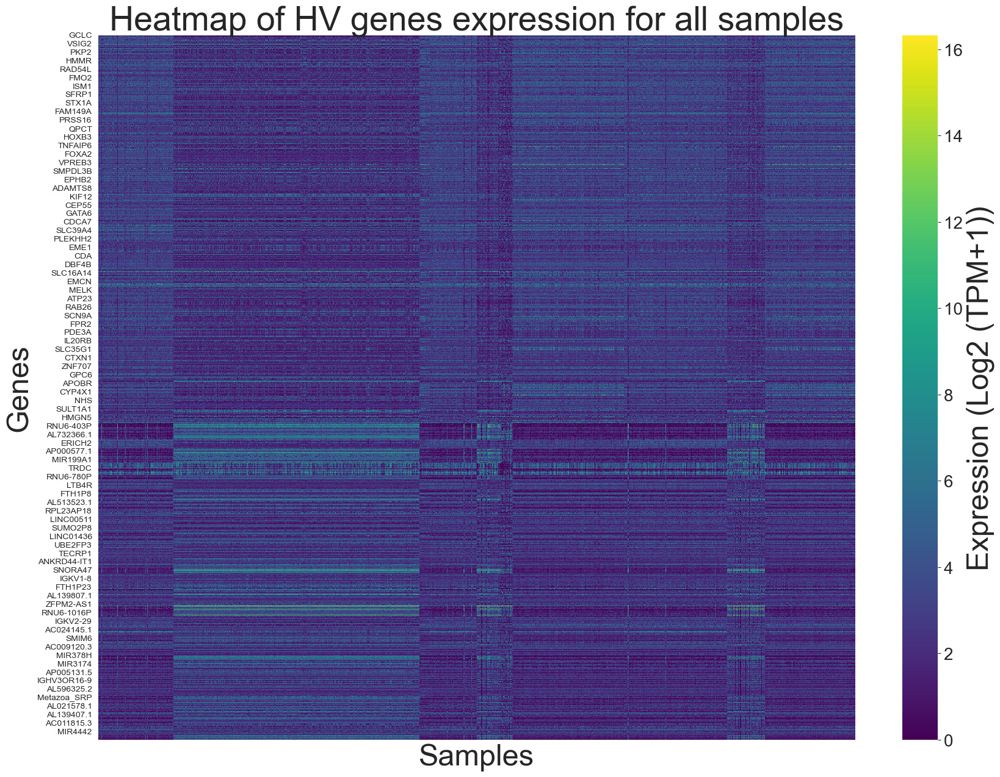

In [15]:
plt.figure(figsize = (20, 15)) 

heatmap = sns.heatmap(subset, cmap = 'viridis', xticklabels = False)

plt.title('Heatmap of HV genes expression for all samples', fontsize = 40)
plt.xlabel('Samples', fontsize = 35)
plt.ylabel('Genes', fontsize = 35)

cbar = heatmap.collections[0].colorbar
cbar.ax.set_ylabel('Expression (Log2 (TPM+1))', fontsize = 35)
cbar.ax.tick_params(labelsize = 20)

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/sel_norm_heatmap.png')

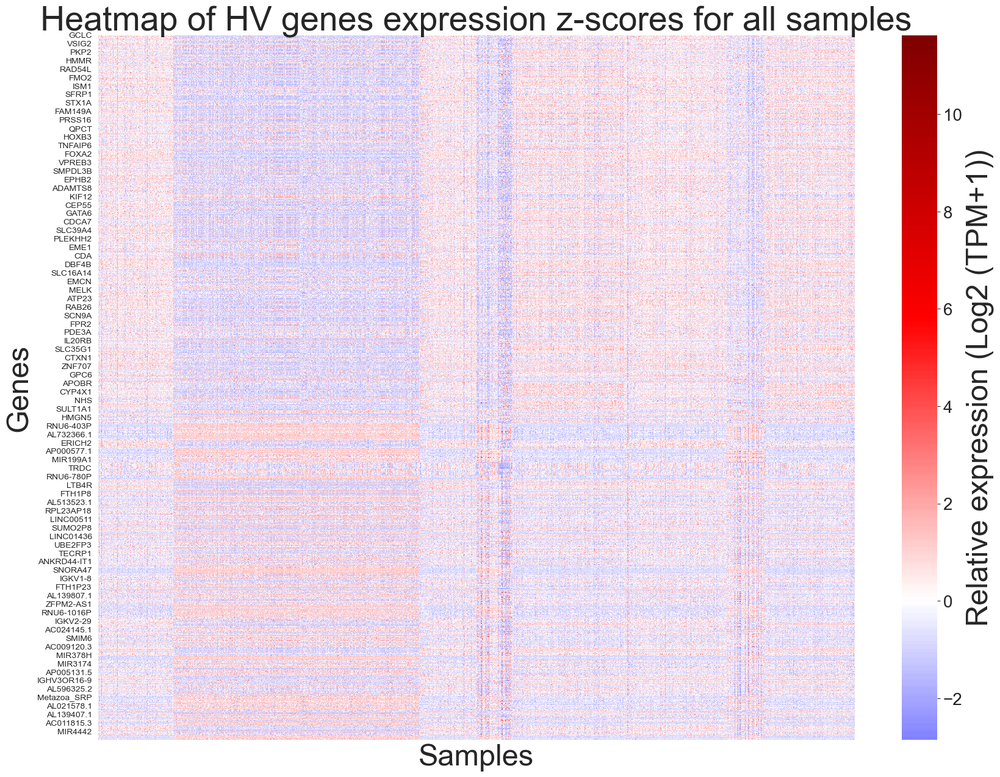

In [16]:
plt.figure(figsize = (20, 15)) 

heatmap = sns.heatmap(z_scores, cmap = 'seismic', xticklabels = False, center = 0)

plt.title('Heatmap of HV genes expression z-scores for all samples', fontsize = 40)
plt.xlabel('Samples', fontsize = 35)
plt.ylabel('Genes', fontsize = 35)


cbar = heatmap.collections[0].colorbar
cbar.ax.set_ylabel('Relative expression (Log2 (TPM+1))', fontsize = 35)
cbar.ax.tick_params(labelsize = 20)

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/sel_norm_zheatmap.png')

/Users/claudiavicentecomorera/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/Users/claudiavicentecomorera/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


<Figure size 2000x1500 with 0 Axes>

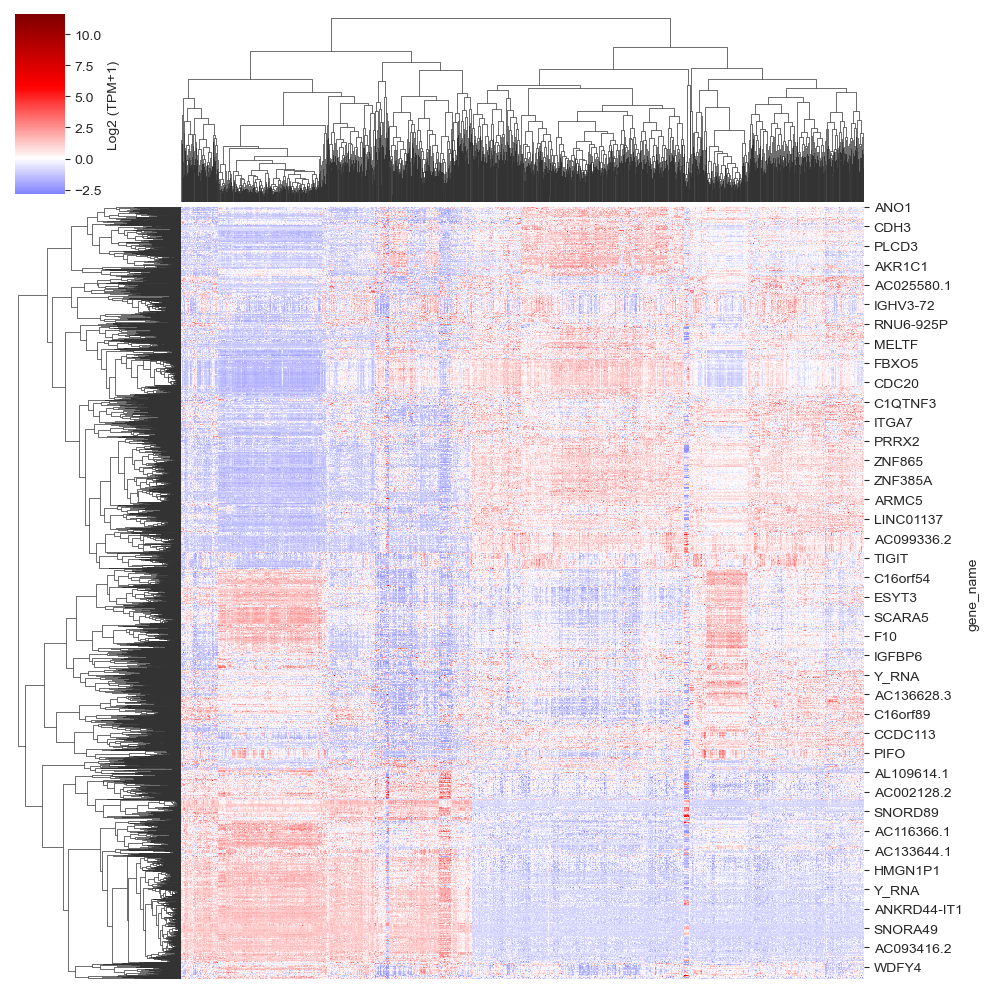

In [17]:
plt.figure(figsize = (20, 15))

sns.clustermap(z_scores, cmap = 'seismic', xticklabels = False, center = 0, 
                method = 'complete', metric = 'cosine', cbar_kws = {'label':'Log2 (TPM+1)'})

plt.savefig('/Volumes/TOSHIBA EXT/4t curs/Advanced Bioinformatics/Project/Python/Graphs/norm_zclustermap.png')